In [1]:
import pandas as pd
import PublicDataReader as pdr

# 공공데이터 API key
serviceKey = "41eZyWQ6neS9cPl%2FO86ho3kURVQeU5iRr8JLlrorVenYW0aoqK%2BQys6Fw6sLlAkMw3BP4XiUcjQ3BHPoElxrLg%3D%3D"
# 아파트실거래 데이터 모듈
AptTrade = pdr.AptTradeReader(serviceKey)

# 자치구 코드 추출
sido = ['서울특별시', '경기도']

df_code = pd.DataFrame()
for sd in sido:
    code = AptTrade.CodeFinder(sd)
    df_code = df_code.append(code)
    
    
df_code.head()

>>> 서비스가 정상 작동합니다.


,법정동명,법정구코드
0,서울특별시,11000
1,서울특별시 종로구,11110
2,서울특별시 종로구 청운동,11110
3,서울특별시 종로구 신교동,11110
4,서울특별시 종로구 궁정동,11110


In [2]:
goo = df_code[(df_code.법정동명.str.split(' ', expand =  True)[1].notnull()) &
              (df_code.법정동명.str.split(' ', expand =  True)[2].isnull())]

goo = goo.append(df_code[(df_code.법정동명.str.split(' ', expand =  True)[2].notnull()) &
                  (df_code.법정동명.str.split(' ', expand =  True)[3].isnull())])

goo = goo.drop_duplicates('법정구코드', keep = 'first')

goo

,법정동명,법정구코드
1,서울특별시 종로구,11110
89,서울특별시 중구,11140
164,서울특별시 용산구,11170
201,서울특별시 성동구,11200
219,서울특별시 광진구,11215
...,...,...
395,경기도 고양시 일산동구,41285
409,경기도 고양시 일산서구,41287
611,경기도 용인시 처인구,41461
701,경기도 용인시 기흥구,41463


In [3]:
goo_nm = goo.법정동명.unique()
t1 = "2020-01"
t2 = "2020-06"

ym_list = pd.date_range(pd.datetime(int(t1[:4]), int(t1[-2:]), 1), pd.datetime(int(t2[:4]), int(t2[-2:]), 1) + pd.Timedelta('31 days'), freq = 'M')

# 데이터 호출
df_AptTradeSum = pd.DataFrame()
for gg in goo_nm:
    goo_cd = goo[goo.법정동명.str.contains(gg)]['법정구코드'].values[0]
    for ym in ym_list:
        ym = str(ym.year) + str(ym.month).zfill(2)
        try:
            df_AptTradeSum = df_AptTradeSum.append(pd.read_csv(f'data/apt_sale/{goo_cd}_{ym}.csv'))   # 기타 서비스 함수 동일
        except:
            continue
        
df_AptTradeSum.head()

/Users/jireh.park/.conda/envs/subway-place/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  """


,지역코드,법정동,거래일,아파트,지번,전용면적,층,건축년도,거래금액,yyyymm,yyyy,price,addr,시군구
0,11110,구기동,2020-01-09,마운틴뷰,125-5,73.39,5,2019,57000,202001,2020,776.672571,구기동 125-5,서울특별시 종로구
1,11110,내수동,2020-01-06,세종로대우,167,109.91,11,1994,88000,202001,2020,800.655081,내수동 167,서울특별시 종로구
2,11110,내수동,2020-01-09,킹스매너,110-15,194.43,4,2004,130000,202001,2020,668.621098,내수동 110-15,서울특별시 종로구
3,11110,내수동,2020-01-20,경희궁 파크팰리스,95,148.09,8,2003,149000,202001,2020,1006.144912,내수동 95,서울특별시 종로구
4,11110,명륜2가,2020-01-18,아남1,4,84.90,5,1995,89800,202001,2020,1057.714959,명륜2가 4,서울특별시 종로구


In [4]:
df_AptTradeSum.shape

(176914, 14)

In [5]:
sgg_price = df_AptTradeSum.groupby('시군구').거래금액.describe()
sgg_price

,count,mean,std,min,25%,50%,75%,max
시군구,,,,,,,,
경기도 가평군,107.0,18358.971963,6608.290239,5400.0,12925.0,19600.0,23700.0,28500.0
경기도 고양시 덕양구,4486.0,35769.845742,14404.525996,6500.0,24000.0,33300.0,46000.0,88000.0
경기도 고양시 일산동구,2891.0,40747.311657,18168.256617,6000.0,27800.0,36000.0,52000.0,172500.0
경기도 고양시 일산서구,4380.0,39462.884247,18902.755190,7500.0,26000.0,33650.0,49000.0,108960.0
경기도 과천시,115.0,132653.913043,22897.373200,87000.0,120000.0,131000.0,140000.0,245000.0
...,...,...,...,...,...,...,...,...
서울특별시 용산구,633.0,147234.862559,92050.626282,15000.0,95800.0,129500.0,170000.0,730000.0
서울특별시 은평구,1830.0,57853.103279,21618.571046,8510.0,40800.0,58000.0,74000.0,146000.0
서울특별시 종로구,351.0,76785.985755,42308.797195,8300.0,49200.0,69000.0,98250.0,197500.0


In [6]:
# 시각화 
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
 
from IPython.core.pylabtools import figsize
from matplotlib import pyplot as plt
 
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 10]

from matplotlib import rc, font_manager
font_location = '/Users/jireh.park/Library/Fonts/야놀자 야체 OTF Bold.otf'
font_name = font_manager.FontProperties(fname=font_location).get_name()
matplotlib.rc('font', family=font_name)

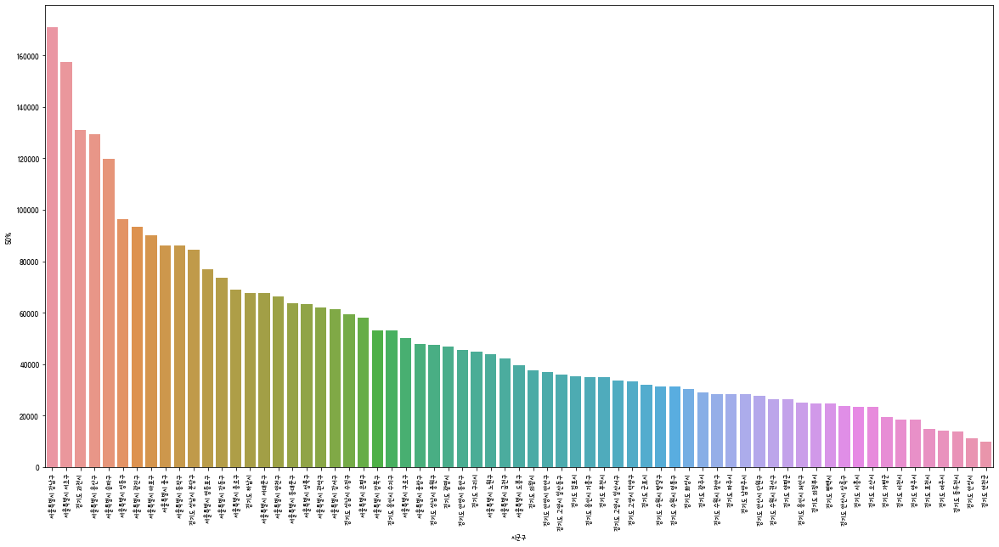

In [7]:
sns.barplot(x = '시군구',
            y = '50%',
            data = sgg_price.reset_index().sort_values('50%', ascending = False))

plt.xticks(rotation=90)
plt.show()

In [21]:
# github에서 지도 가져오기
import requests 
import json 

url = 'https://raw.githubusercontent.com/vuski/admdongkor/master/ver20200401/HangJeongDong_ver20200401.geojson'
response = requests.get(url)
res_json = response.json()

# save
with open('admin_map.txt', 'w') as outfile:
    json.dump(res_json, outfile)

In [26]:
res_json

{'type': 'FeatureCollection',
 'name': 'HangJeongDong_ver20200401',
 'crs': {'type': 'name',
  'properties': {'name': 'urn:ogc:def:crs:OGC:1.3:CRS84'}},
 'features': [{'type': 'Feature',
   'properties': {'OBJECTID': 0,
    'adm_nm': '서울특별시 종로구 사직동',
    'adm_cd': '1101053',
    'adm_cd2': '1111053000'},
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[126.97688884274817, 37.575650779448786],
       [126.9770344988775, 37.569194530054546],
       [126.97597472821249, 37.569336299425764],
       [126.97537470991254, 37.56931556702156],
       [126.97433193562325, 37.56926180051753],
       [126.96904837001854, 37.56819441770833],
       [126.96854493603384, 37.56842767961276],
       [126.9666499598212, 37.569491655206576],
       [126.96628175024485, 37.5697007347987],
       [126.9660973270804, 37.5698565097237],
       [126.96572852922577, 37.570183936115114],
       [126.96592699822128, 37.5703188056862],
       [126.96601094018429, 37.57154839557748],
       [126.9636

In [85]:
import geopandas as gpd 

map_41 = gpd.read_file('map/41000/TL_SCCO_SIG.shp', encoding='cp949')
map_11 = gpd.read_file('map/11000/TL_SCCO_SIG.shp', encoding='cp949')

map_met = map_41.append(map_11)
map_met = map_met.set_crs(epsg=5179)
map_met = map_met.to_crs("EPSG:4326")

file_path = "map/metropolitan.geojson"
map_met.to_file(file_path, driver='GeoJSON')

import geojson

with open(file_path) as f:
    map_met_json = geojson.load(f)
    

In [49]:
sgg_price_cd = pd.merge(sgg_price.reset_index(),
                         goo,
                         how = 'inner',
                         left_on = '시군구',
                         right_on = '법정동명')

In [91]:
sgg_price_cd

,시군구,count,mean,std,min,25%,50%,75%,max,법정동명,법정구코드
0,경기도 가평군,107.0,18358.971963,6608.290239,5400.0,12925.0,19600.0,23700.0,28500.0,경기도 가평군,41820
1,경기도 고양시 덕양구,4486.0,35769.845742,14404.525996,6500.0,24000.0,33300.0,46000.0,88000.0,경기도 고양시 덕양구,41281
2,경기도 고양시 일산동구,2891.0,40747.311657,18168.256617,6000.0,27800.0,36000.0,52000.0,172500.0,경기도 고양시 일산동구,41285
3,경기도 고양시 일산서구,4380.0,39462.884247,18902.755190,7500.0,26000.0,33650.0,49000.0,108960.0,경기도 고양시 일산서구,41287
4,경기도 과천시,115.0,132653.913043,22897.373200,87000.0,120000.0,131000.0,140000.0,245000.0,경기도 과천시,41290
...,...,...,...,...,...,...,...,...,...,...,...
62,서울특별시 용산구,633.0,147234.862559,92050.626282,15000.0,95800.0,129500.0,170000.0,730000.0,서울특별시 용산구,11170
63,서울특별시 은평구,1830.0,57853.103279,21618.571046,8510.0,40800.0,58000.0,74000.0,146000.0,서울특별시 은평구,11380
64,서울특별시 종로구,351.0,76785.985755,42308.797195,8300.0,49200.0,69000.0,98250.0,197500.0,서울특별시 종로구,11110
65,서울특별시 중구,485.0,85860.731959,33126.455978,9300.0,70000.0,86000.0,104500.0,304000.0,서울특별시 중구,11140


In [127]:
map_met_json['features'][0]['properties']

{'SIG_CD': '41111',
 'SIG_ENG_NM': 'Jangan-gu, Suwon-si',
 'SIG_KOR_NM': '수원시 장안구'}

In [126]:
sgg_price_cd.loc[sgg_price_cd['법정구코드'] == '41111', '50%'].values[0]

28500.0

In [137]:
# append tooltip 
for idx in range(len(map_met_json['features'])):
    sig_cd = map_met_json['features'][idx]['properties']['SIG_CD']
    goo_nm = map_met_json['features'][idx]['properties']['SIG_KOR_NM']
    price = int(sgg_price_cd.loc[sgg_price_cd['법정구코드'] == sig_cd, '50%'].values[0])
    map_met_json['features'][idx]['properties']['중위가격(만원)'] = f'{goo_nm}, {price}'

In [141]:
import folium

# 서울시 중심부의 위도, 경도 입니다. 
center = [37.541, 126.986] 
# 맵이 center 에 위치하고, zoom 레벨은 11로 시작하는 맵 m을 만듭니다. 
m = folium.Map(location=center, zoom_start=9) 

# Choropleth 레이어를 만들고, 맵 m에 추가합니다. 
base = folium.Choropleth( 
                geo_data=map_met_json, 
                data=sgg_price_cd, 
                columns=('법정구코드', '50%'), 
                fill_color='BuPu', 
                legend_name='아파트 매매 중위가격',
                tooltip = 1,
                key_on='feature.properties.SIG_CD').add_to(m) 

folium.LayerControl().add_to(m)

# Display Region Label
base.geojson.add_child(
    folium.features.GeoJsonTooltip(['중위가격(만원)'], labels=True)
)

m.save('goo_apt_median.md')


# 맵 m을 출력합니다. 
m
